In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv(r"D:\Lisys Internship\diabetic_data.csv")
df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,Amylinomimetic,metformin-pioglitazone,change,weakness,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,Yes,No,No,Yes,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,No,No,No,Yes,No,Ch,Yes,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,Yes,No,No,Yes,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,No,No,No,Yes,No,Ch,Yes,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,No,No,No,Yes,No,Ch,Yes,Yes,NO


In [3]:
df.shape

(101766, 52)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 52 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [5]:
print("Checking Categorical and Numerical Values")
df_cat = df.select_dtypes(include=object)  # Use 'object' directly instead of np.object
df_num = df.select_dtypes(include=np.number)
print('Total Categorical Columns:', len(df_cat.columns))
print('\n')
print('Categorical values names: ', df_cat.columns)
print('\n')
print('Total Numerical Columns:', len(df_num.columns))
print('\n')
print('Numerical values names: ', df_num.columns)

Checking Categorical and Numerical Values
Total Categorical Columns: 39


Categorical values names:  Index(['race', 'gender', 'age', 'weight', 'payer_code', 'medical_specialty',
       'diag_1', 'diag_2', 'diag_3', 'max_glu_serum', 'A1Cresult', 'metformin',
       'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride',
       'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone', 'Amylinomimetic',
       'metformin-pioglitazone', 'change', 'weakness', 'diabetesMed',
       'readmitted'],
      dtype='object')


Total Numerical Columns: 13


Numerical values names:  Index(['encounter_id', 'patient_nbr', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'num_lab_procedures',

In [6]:
# checking missing values
df.isnull().sum()

encounter_id                0
patient_nbr                 0
race                        0
gender                      0
age                         0
weight                      0
admission_type_id           0
discharge_disposition_id    0
admission_source_id         0
time_in_hospital            0
payer_code                  0
medical_specialty           0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
diag_1                      0
diag_2                      0
diag_3                      0
number_diagnoses            0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazo

In [7]:
#In the dataset we have many values in the form of ? 
for i in df.columns:
    if df[i].dtype == object: 
        print(i, df[i][df[i] == '?'].count())

race 2273
gender 0
age 0
weight 98569
payer_code 40256
medical_specialty 49949
diag_1 21
diag_2 358
diag_3 1423
max_glu_serum 0
A1Cresult 0
metformin 0
repaglinide 0
nateglinide 0
chlorpropamide 0
glimepiride 0
acetohexamide 0
glipizide 0
glyburide 0
tolbutamide 0
pioglitazone 0
rosiglitazone 0
acarbose 0
miglitol 0
troglitazone 0
tolazamide 0
examide 0
citoglipton 0
insulin 0
glyburide-metformin 0
glipizide-metformin 0
glimepiride-pioglitazone 0
metformin-rosiglitazone 0
Amylinomimetic 0
metformin-pioglitazone 0
change 0
weakness 0
diabetesMed 0
readmitted 0


In [8]:
#dropping this column because it contains more than 45% missing values
df = df.drop(['weight', 'payer_code', 'medical_specialty'], axis =1)

In [9]:
#dropping this columns as well because it have no relation with the prediction
df= df.drop(['encounter_id','patient_nbr' ], axis =1)

In [10]:
#filling some missing values in few of the columns 
df['race'].value_counts()

race
Caucasian          76099
AfricanAmerican    19210
?                   2273
Hispanic            2037
Other               1506
Asian                641
Name: count, dtype: int64

In [11]:
df['race'] = df['race'].replace('?',np.nan)

In [12]:
df['race'].unique()

array(['Caucasian', 'AfricanAmerican', nan, 'Other', 'Asian', 'Hispanic'],
      dtype=object)

In [13]:
#filling the missing value with mode
df['race'] = df['race'].fillna(df['race'].mode()[0])

In [14]:
df['race'].value_counts()

race
Caucasian          78372
AfricanAmerican    19210
Hispanic            2037
Other               1506
Asian                641
Name: count, dtype: int64

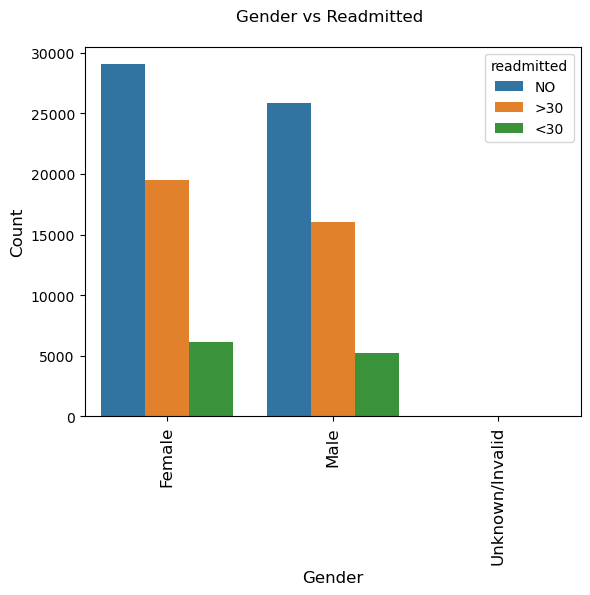

In [15]:
#gender vs readmitted
ax = sns.countplot(x="gender", hue="readmitted", data=df)
plt.xlabel('Gender', size = 12)
plt.xticks(rotation=90, size = 12)
plt.ylabel('Count', size = 12)
plt.title('Gender vs Readmitted \n', size = 12)
plt.show()

In [16]:
df['gender'].value_counts()

gender
Female             54708
Male               47055
Unknown/Invalid        3
Name: count, dtype: int64

In [17]:
#dropping the inavlid gender type
df['gender'] = df['gender'].replace('Unknown/Invalid', np.nan)
df['gender'].dropna(inplace=True)

In [18]:
#one-hot encoding for converting string into numeric for the race column
# Perform one-hot encoding on the 'race' column
race_encoded = pd.get_dummies(df['race'], prefix='race')

# Concatenate the original DataFrame with the one-hot encoded columns
df_encoded = pd.concat([df, race_encoded], axis=1)

# Drop the original 'race' column if needed
df_encoded.drop('race', axis=1, inplace=True)

# Merge back to the main DataFrame
df = pd.merge(df, race_encoded, left_index=True, right_index=True)

# Display the updated DataFrame
print(df.head())

              race  gender      age  admission_type_id  \
0        Caucasian  Female   [0-10)                  6   
1        Caucasian  Female  [10-20)                  1   
2  AfricanAmerican  Female  [20-30)                  1   
3        Caucasian    Male  [30-40)                  1   
4        Caucasian    Male  [40-50)                  1   

   discharge_disposition_id  admission_source_id  time_in_hospital  \
0                        25                    1                 1   
1                         1                    7                 3   
2                         1                    7                 2   
3                         1                    7                 2   
4                         1                    7                 1   

   num_lab_procedures  num_procedures  num_medications  ...  \
0                  41               0                1  ...   
1                  59               0               18  ...   
2                  11               5    

In [19]:
#one-hot encoding for converting string into numeric for the gender column
# Perform one-hot encoding on the 'race' column
gender_encoded = pd.get_dummies(df['gender'], prefix='gender')

# Concatenate the original DataFrame with the one-hot encoded columns
df_encoded = pd.concat([df, gender_encoded], axis=1)

# Drop the original 'race' column if needed
df_encoded.drop('gender', axis=1, inplace=True)

# Merge back to the main DataFrame
df = pd.merge(df, gender_encoded, left_index=True, right_index=True)

# Display the updated DataFrame
print(df.head())

              race  gender      age  admission_type_id  \
0        Caucasian  Female   [0-10)                  6   
1        Caucasian  Female  [10-20)                  1   
2  AfricanAmerican  Female  [20-30)                  1   
3        Caucasian    Male  [30-40)                  1   
4        Caucasian    Male  [40-50)                  1   

   discharge_disposition_id  admission_source_id  time_in_hospital  \
0                        25                    1                 1   
1                         1                    7                 3   
2                         1                    7                 2   
3                         1                    7                 2   
4                         1                    7                 1   

   num_lab_procedures  num_procedures  num_medications  ...  weakness  \
0                  41               0                1  ...       Yes   
1                  59               0               18  ...       Yes   
2          

In [20]:
# Convert boolean columns to numeric (0s and 1s)
df['race_AfricanAmerican'] = df['race_AfricanAmerican'].astype(int)
df['race_Asian'] = df['race_Asian'].astype(int)
df['race_Caucasian'] = df['race_Caucasian'].astype(int)
df['race_Hispanic'] = df['race_Hispanic'].astype(int)
df['race_Other'] = df['race_Other'].astype(int)

df['gender_Female'] = df['gender_Female'].astype(int)
df['gender_Male'] = df['gender_Male'].astype(int)

In [21]:
df = df.drop(['race', 'gender'], axis =1)

In [22]:
#pre-processing the age column
df['age'] =df['age'].replace({'[0-10)':5, '[10-20)':10, '[20-30)':25, '[30-40)':35, '[40-50)':45, '[50-60)':55, '[60-70)':65, 
                              '[70-80)':75, '[80-90)':85, '[90-100)':95,})

In [23]:
#now pre-processing the diag_1, diag_2, diag_3 column. This column contains both the values string as well as numeric.
#so we will seprate the string and numeric column.
#filling the missing values with nan
df['diag_1'] = df['diag_1'].replace('?',np.nan)
df['diag_2'] = df['diag_2'].replace('?',np.nan)
df['diag_3'] = df['diag_3'].replace('?',np.nan)

In [24]:
#filling the nan values with mode
df['diag_1'] = df['diag_1'].fillna(df['diag_1'].mode()[0])
df['diag_2'] = df['diag_2'].fillna(df['diag_2'].mode()[0])
df['diag_3'] = df['diag_3'].fillna(df['diag_3'].mode()[0])

In [25]:
#seprating the numeric and string now from this three columns.
df['diag1_num'] = df['diag_1'].str.extract(r'(\d+)')
df['diag1_cat'] = df['diag_1'].str.extract(r'([A-Za-z]+)')

df['diag2_num'] = df['diag_2'].str.extract(r'(\d+)')
df['diag2_cat'] = df['diag_2'].str.extract(r'([A-Za-z]+)')

df['diag3_num'] = df['diag_3'].str.extract(r'(\d+)')
df['diag3_cat'] = df['diag_3'].str.extract(r'([A-Za-z]+)')

In [26]:
#after evaluating both the columns string values are very less. So, we have decided to remove it.
df = df.drop(['diag1_cat', 'diag2_cat','diag3_cat','diag_1','diag_2','diag_3'], axis =1)

In [27]:
df['diag1_num'] = df['diag1_num'].astype(int)
df['diag2_num'] = df['diag2_num'].astype(int)
df['diag3_num'] = df['diag3_num'].astype(int)

In [28]:
df['discharge_disposition_id'] = df['discharge_disposition_id'].apply(lambda x : 1 if int(x) in [6, 8, 9, 13] 
                                                                           else ( 2 if int(x) in [3, 4, 5, 14, 22, 23, 24]
                                                                           else ( 10 if int(x) in [12, 15, 16, 17]
                                                                           else ( 11 if int(x) in [19, 20, 21]
                                                                           else ( 18 if int(x) in [25, 26] 
                                                                           else int(x) )))))

df = df[~df.discharge_disposition_id.isin([11,13,14,19,20,21])]

df['admission_type_id'] = df['admission_type_id'].apply(lambda x : 1 if int(x) in [2, 7]
                                                            else ( 5 if int(x) in [6, 8]
                                                            else int(x) ))

df['admission_source_id'] = df['admission_source_id'].apply(lambda x : 1 if int(x) in [2, 3]
                                                            else ( 4 if int(x) in [5, 6, 10, 22, 25]
                                                            else ( 9 if int(x) in [15, 17, 20, 21]
                                                            else ( 11 if int(x) in [13, 14]
                                                            else int(x) ))))

for col in ["metformin", "repaglinide", "nateglinide", "chlorpropamide", "glimepiride", "acetohexamide", "glipizide", "glyburide", "tolbutamide", "pioglitazone", "rosiglitazone", "acarbose", "miglitol", "troglitazone", "tolazamide", "examide", "citoglipton", "insulin", "glyburide-metformin", "glipizide-metformin", "glimepiride-pioglitazone", "metformin-rosiglitazone", "metformin-pioglitazone"]:
    df[col] = df[col].apply(lambda x : 10 if x == 'Up' 
                                              else ( -10 if x == 'Down'                                                          
                                              else ( 0 if x == 'Steady'
                                              else  -20)))


df['change'] = df['change'].apply(lambda x : 1 if x == 'Ch'
                                                 else -1)


df['diabetesMed'] = df['diabetesMed'].apply(lambda x : -1 if x == 'No'
                                                else 1)


df['max_glu_serum'] = df['max_glu_serum'].apply(lambda x : 200 if x == '>200' 
                                                            else ( 300 if x == '>300'                                                          
                                                            else ( 100 if x == 'Norm'
                                                            else  0)))

df['A1Cresult'] = df['A1Cresult'].apply(lambda x : 7 if x == '>7' 
                                                         else (8 if  x == '>8'                                                        
                                                         else ( 5 if x == 'Norm'
                                                         else  0)))


In [29]:
#our target variable 
df['readmitted'] = df['readmitted'].replace({'>30' : 1,'NO':0, '<30':1  })

In [30]:
#now doing some data anlysis

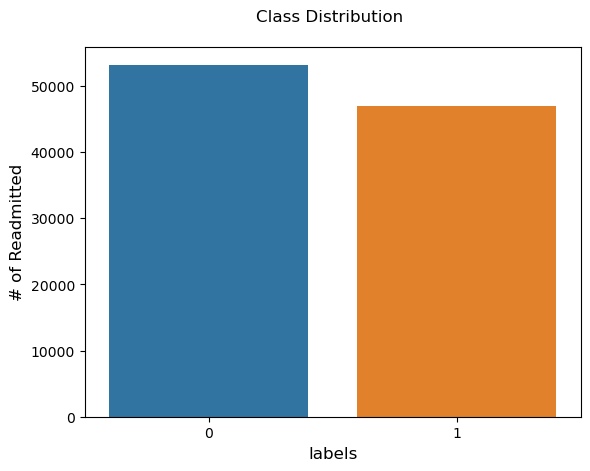

In [31]:
# class distribution of readmitted.
ax = sns.barplot(x=df['readmitted'].value_counts().index,   y=df['readmitted'].value_counts())
plt.xlabel('labels', size = 12)
plt.ylabel('# of Readmitted', size = 12)
plt.title('Class Distribution \n', size = 12)
plt.show()

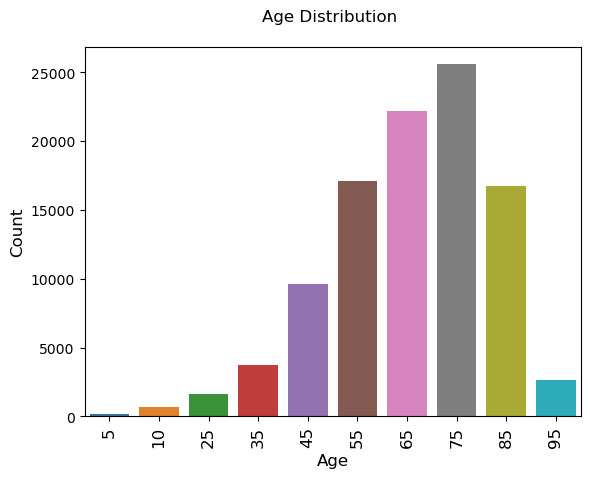

In [32]:
#age distribution of patient
ax = sns.countplot(x='age',   data= df)
plt.xlabel('Age', size = 12)
plt.xticks(rotation=90, size = 12)
plt.ylabel('Count', size = 12)
plt.title('Age Distribution \n', size = 12)
plt.show()

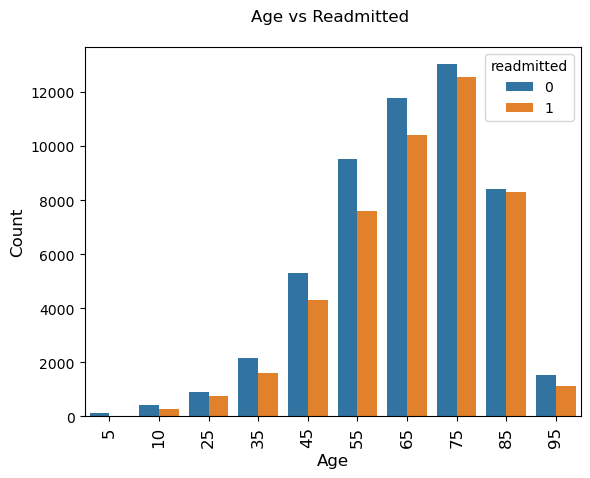

In [33]:
#Relationship between age and readmitted
ax = sns.countplot(x="age", hue="readmitted", data=df)
plt.xlabel('Age', size = 12)
plt.xticks(rotation=90, size = 12)
plt.ylabel('Count', size = 12)
plt.title('Age vs Readmitted \n', size = 12)
plt.show()

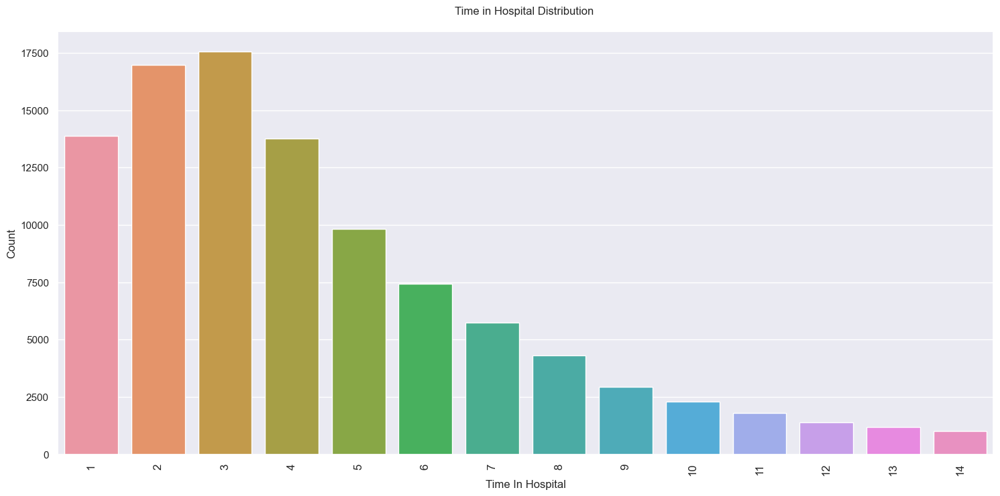

In [34]:
#after how many days patient got discharge

sns.set(rc={'figure.figsize':(18,8.2)})
ax = sns.countplot(x='time_in_hospital',   data= df)
plt.xlabel('Time In Hospital', size = 12)
plt.xticks(rotation=90, size = 12)
plt.ylabel('Count', size = 12)
plt.title('Time in Hospital Distribution \n', size = 12)
plt.show()


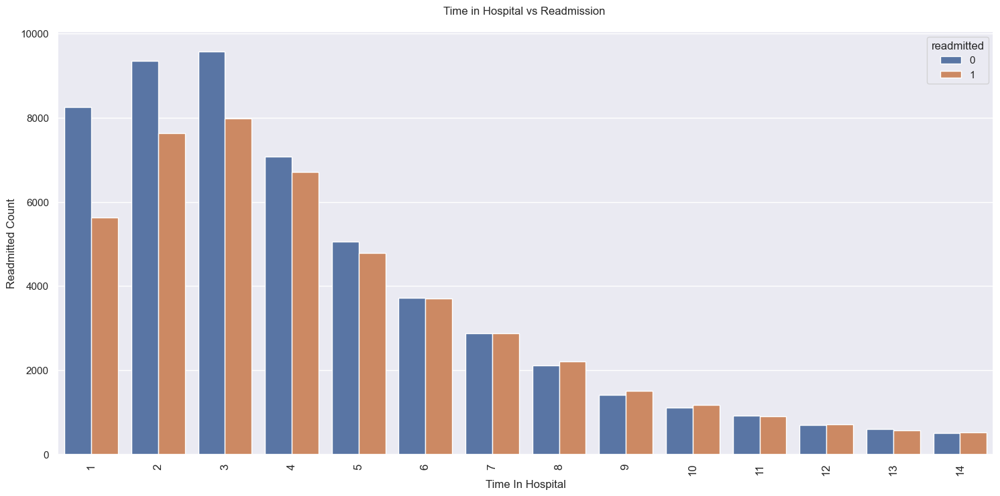

In [35]:
#Stay in Hospital and Readmission

sns.set(rc={'figure.figsize':(18,8.2)})
ax = sns.countplot(x='time_in_hospital',  hue= 'readmitted',  data= df)
plt.xlabel('Time In Hospital', size = 12)
plt.xticks(rotation=90, size = 12)
plt.ylabel('Readmitted Count', size = 12)
plt.title('Time in Hospital vs Readmission \n', size = 12)
plt.show()

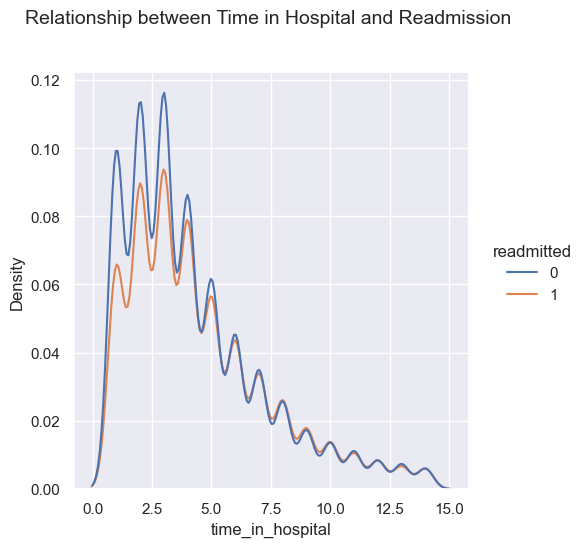

In [36]:
sns.set(rc={'figure.figsize':(18, 8.2)})
sns.displot(df, x="time_in_hospital", hue = 'readmitted', kind="kde")
plt.title('Relationship between Time in Hospital and Readmission \n\n', size  = 14)
plt.show()

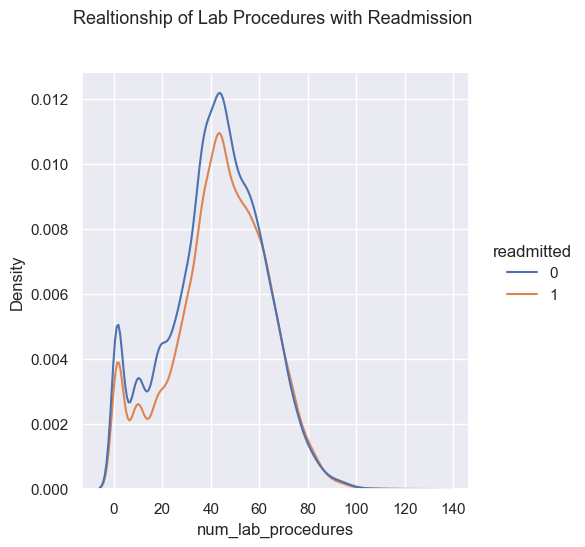

In [37]:
#Trend of Lab Procedures with Readmission ?

sns.displot(df, x="num_lab_procedures", hue= 'readmitted', kind="kde")
plt.title('Realtionship of Lab Procedures with Readmission \n\n', size = 13)
plt.show()

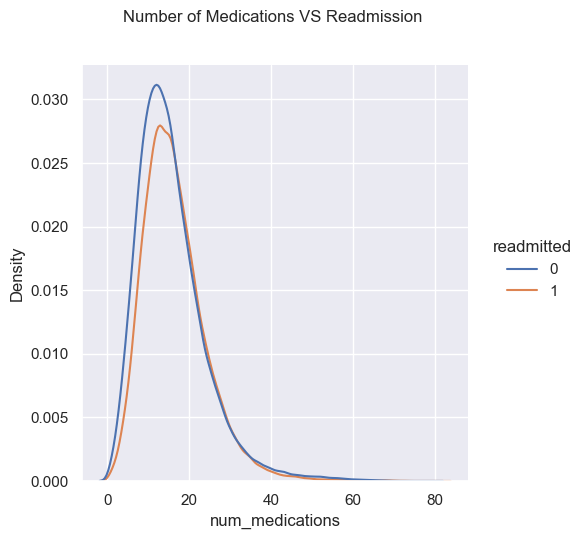

In [38]:
#relation between num_medication vs readmission
sns.displot(df, x="num_medications", hue= 'readmitted', kind="kde")
plt.title('Number of Medications VS Readmission \n\n')
plt.show()

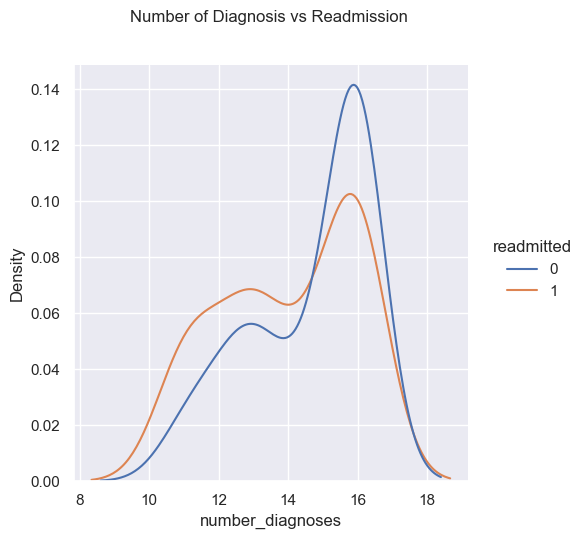

In [39]:
#relation between no of diagnosis and readmission 
sns.displot(df[df['number_diagnoses']>10], x="number_diagnoses", hue= 'readmitted', kind='kde')
plt.title('Number of Diagnosis vs Readmission \n\n')
plt.show()

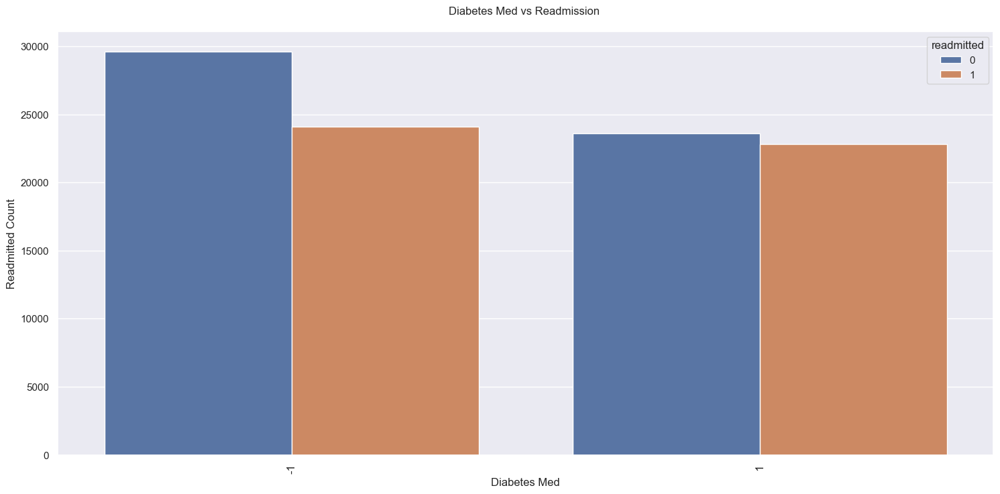

In [40]:
#medicine change vs readmission
ax = sns.countplot(x='change',  hue= 'readmitted',  data= df)
plt.xlabel('Diabetes Med', size = 12)
plt.xticks(rotation=90, size = 12)
plt.ylabel('Readmitted Count', size = 12)
plt.title('Diabetes Med vs Readmission \n', size = 12)
plt.show()

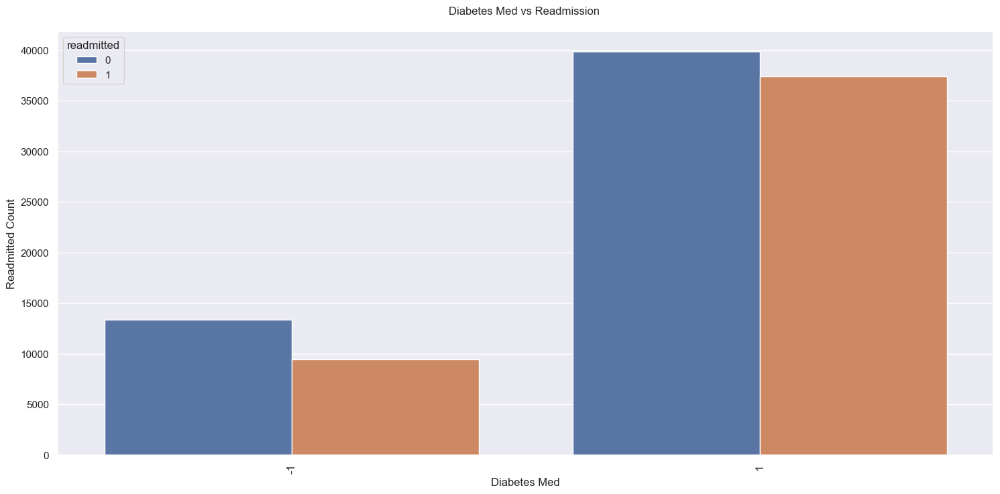

In [41]:
#diabetic med vs readmission
ax = sns.countplot(x='diabetesMed',  hue= 'readmitted',  data= df)
plt.xlabel('Diabetes Med', size = 12)
plt.xticks(rotation=90, size = 12)
plt.ylabel('Readmitted Count', size = 12)
plt.title('Diabetes Med vs Readmission \n', size = 12)
plt.show()

C:\Users\nachi\anaconda3\Lib\site-packages\seaborn\axisgrid.py:447: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


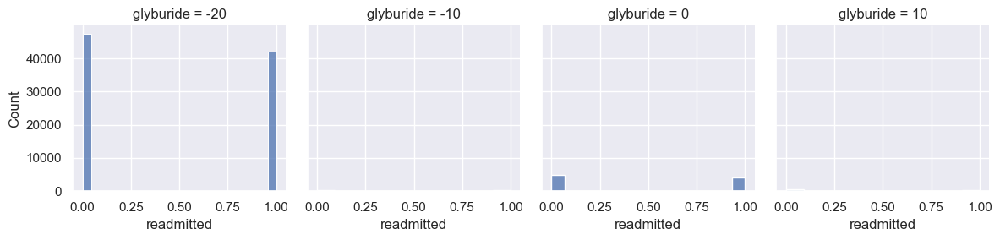

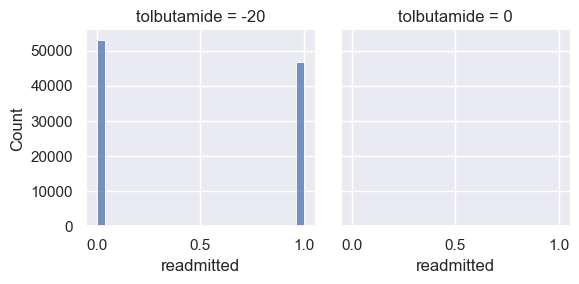

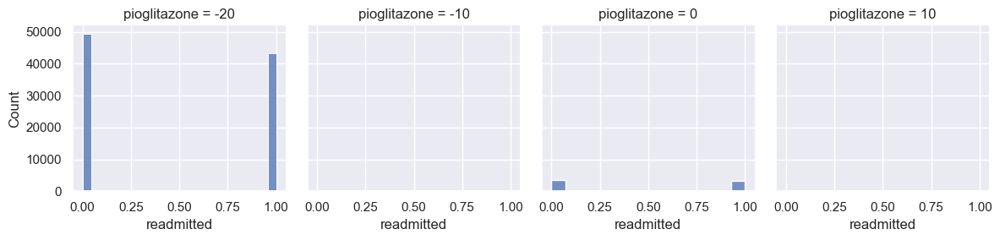

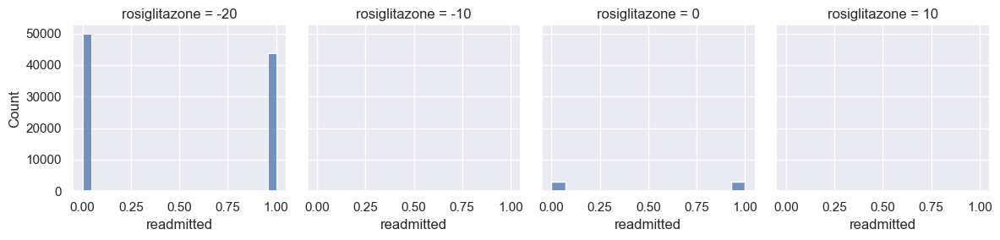

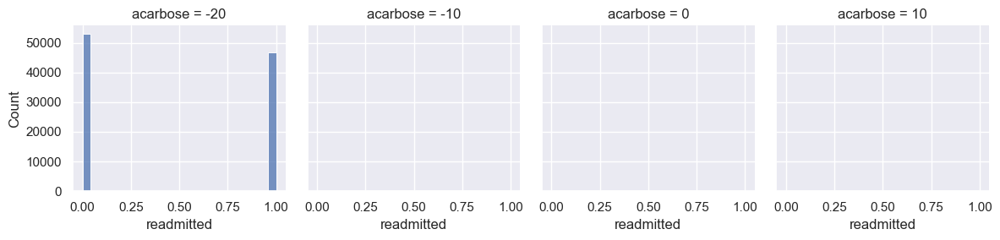

...

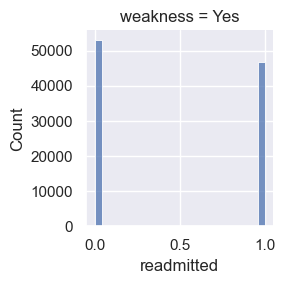

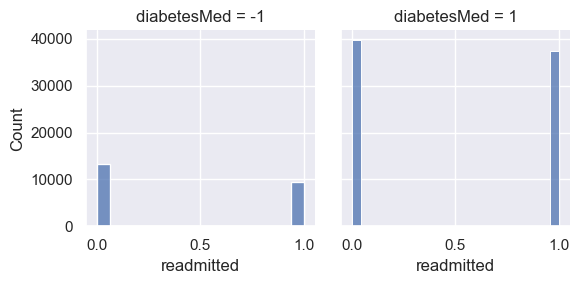

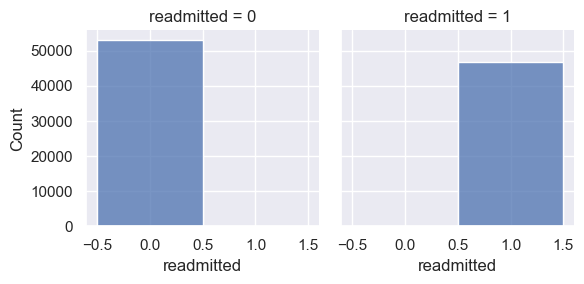

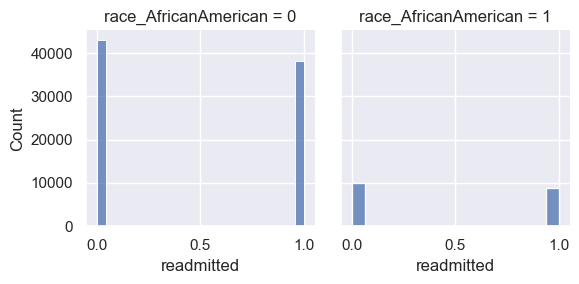

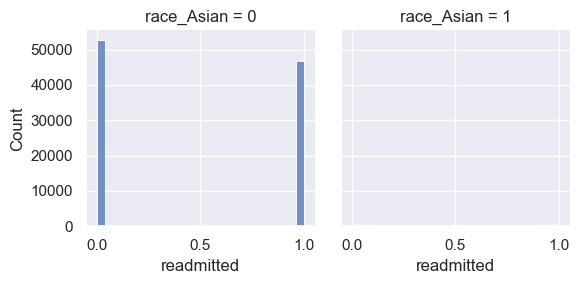

In [42]:
for columnName in df.iloc[:, 21:44].columns:
    g = sns.FacetGrid(df, col=columnName)
    g.map(sns.histplot, "readmitted")
    plt.show

In [43]:
#done in Patient Readmission - Jupyter 

# Top 10 features selected by ANOVA F-test
# checked p value of columns 

In [44]:
#combining some features into one column 
df['severity_of_disease'] = df['time_in_hospital'] + df['num_procedures'] + df['num_medications'] + df['num_lab_procedures']

In [45]:
df = df.drop(['time_in_hospital','num_procedures','num_medications','num_lab_procedures','weakness','Amylinomimetic'], axis =1)

# Random Forest With Smote, GridSearchCV and MOE

C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:305: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:305: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:305: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:305: UserWarning: The total space of parameters 16 is smaller than n_iter=20. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\Users\nachi\anaconda3\Lib\site-packages\s

Mixture of Expert Models Metrics with SMOTE and RandomizedSearchCV:
Accuracy with mixture of expert models: 0.646370683579986
Precision: 0.6591256496484256
Recall: 0.6073239436619718
F1 Score: 0.6321653716463862
Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.69      0.66     10635
           1       0.66      0.61      0.63     10650

    accuracy                           0.65     21285
   macro avg       0.65      0.65      0.65     21285
weighted avg       0.65      0.65      0.65     21285



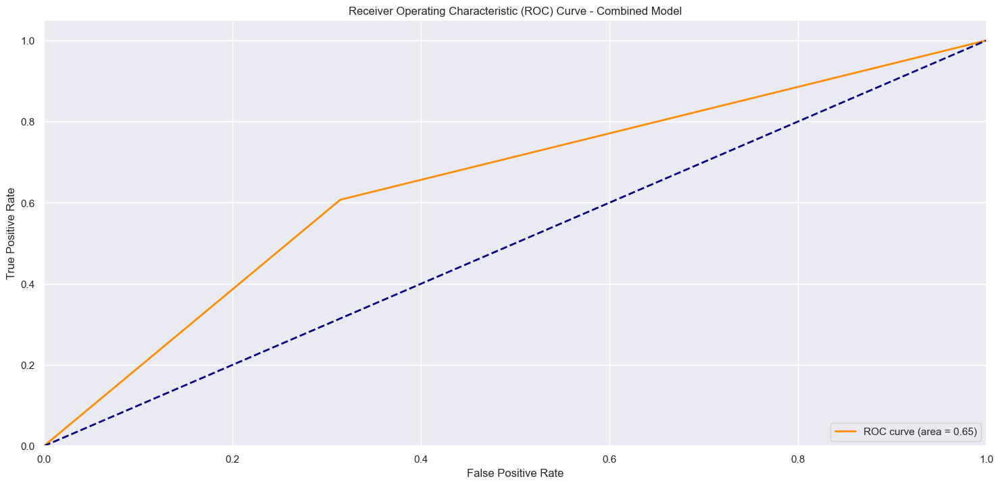

In [46]:
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt


# Assuming your target column is 'readmitted'

# Split data into features (X) and target variable (y)
X = df.drop('readmitted', axis=1)  # Features
y = df['readmitted']  # Target variable

# Apply SMOTE to oversample the minority class
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Split resampled data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Define the number of expert models
num_experts = 5

# Define the parameter grid for RandomizedSearchCV for each expert
param_grid = {
        'n_estimators': [50, 100],
        'max_depth': [None, 10],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2]
}

# Initialize expert models list
expert_models = []

# Train multiple Random Forest classifiers (experts) using RandomizedSearchCV
for i in range(num_experts):
    # Initialize Random Forest Classifier
    rf_classifier = RandomForestClassifier(random_state=42)
    
    # Perform RandomizedSearchCV for hyperparameter tuning
    random_search = RandomizedSearchCV(estimator=rf_classifier, param_distributions=param_grid, n_iter=20, cv=3, scoring='accuracy', random_state=42, n_jobs=-1)
    random_search.fit(X_train, y_train)
    
    # Get the best parameters
    best_params = random_search.best_params_
    
    # Train the model with the best parameters
    best_rf_classifier = RandomForestClassifier(random_state=42, **best_params)
    best_rf_classifier.fit(X_train, y_train)
    
    # Add the trained model to the list of expert models
    expert_models.append(best_rf_classifier)

# Make predictions on the test set with each expert
predictions = np.zeros((num_experts, len(X_test)))
for i, model in enumerate(expert_models):
    predictions[i] = model.predict(X_test)

# Combine predictions using majority voting
combined_predictions = np.round(np.mean(predictions, axis=0))

# Evaluate the combined model
accuracy_combined = accuracy_score(y_test, combined_predictions)
print("Mixture of Expert Models Metrics with SMOTE and RandomizedSearchCV:")
print(f'Accuracy with mixture of expert models: {accuracy_combined}')
precision = precision_score(y_test, combined_predictions)
recall = recall_score(y_test, combined_predictions)
f1 = f1_score(y_test, combined_predictions)

# Print precision, recall, and F1 score for the combined model
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Print classification report for the combined model
print("Classification Report:")
print(classification_report(y_test, combined_predictions))

# Compute ROC curve and AUC for the combined model
fpr, tpr, thresholds = roc_curve(y_test, combined_predictions)
roc_auc = auc(fpr, tpr)

# Plot ROC curve for the combined model
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Combined Model')
plt.legend(loc="lower right")
plt.show()

# Random Forest With Lime 

In [47]:
import lime
import lime.lime_tabular

# Assuming X_test is your test set

# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns, discretize_continuous=True)

# Choose a sample from the test set for explanation
sample_idx = 0  # Choose any index from the test set
sample = X_test.iloc[sample_idx]
true_label = y_test.iloc[sample_idx]

# Explain the prediction using LIME for each expert model
for i, model in enumerate(expert_models):
    # Explain prediction for the sample
    explanation = explainer.explain_instance(sample.values, model.predict_proba, num_features=len(X_train.columns))
    
    print(f"Explanation for Expert Model {i+1} (True Label: {true_label}, Predicted Probability: {model.predict_proba([sample])[0][1]}):")
    explanation.show_in_notebook()  # Display explanation in notebook


Explanation for Expert Model 1 (True Label: 0, Predicted Probability: 0.44994828498679007):


C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Explanation for Expert Model 2 (True Label: 0, Predicted Probability: 0.44994828498679007):


C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Explanation for Expert Model 3 (True Label: 0, Predicted Probability: 0.44994828498679007):


C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Explanation for Expert Model 4 (True Label: 0, Predicted Probability: 0.44994828498679007):


C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Explanation for Expert Model 5 (True Label: 0, Predicted Probability: 0.44994828498679007):


# CatBoost with Smote, GridSearchCV and MOE

Learning rate set to 0.5
0:	learn: 0.6667282	total: 37.3ms	remaining: 3.69s
1:	learn: 0.6488804	total: 66.9ms	remaining: 3.28s
2:	learn: 0.6306498	total: 87.5ms	remaining: 2.83s
3:	learn: 0.6236165	total: 106ms	remaining: 2.53s
4:	learn: 0.6210480	total: 122ms	remaining: 2.31s
5:	learn: 0.6185926	total: 139ms	remaining: 2.18s
6:	learn: 0.6171278	total: 159ms	remaining: 2.11s
7:	learn: 0.6158474	total: 179ms	remaining: 2.06s
8:	learn: 0.6134411	total: 198ms	remaining: 2s
9:	learn: 0.6124458	total: 217ms	remaining: 1.95s
10:	learn: 0.6101852	total: 236ms	remaining: 1.91s
11:	learn: 0.6095999	total: 255ms	remaining: 1.87s
12:	learn: 0.6087540	total: 276ms	remaining: 1.84s
13:	learn: 0.6084138	total: 292ms	remaining: 1.79s
14:	learn: 0.6080962	total: 309ms	remaining: 1.75s
15:	learn: 0.6075709	total: 328ms	remaining: 1.72s
16:	learn: 0.6062406	total: 346ms	remaining: 1.69s
17:	learn: 0.6052942	total: 366ms	remaining: 1.67s
18:	learn: 0.6050031	total: 384ms	remaining: 1.64s
19:	learn: 0.604

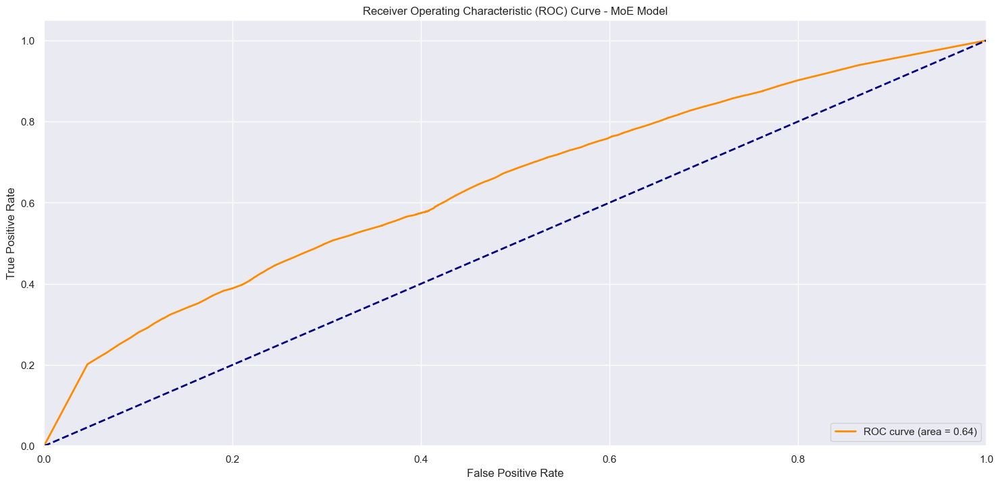

In [50]:
import pandas as pd
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt

# Assuming your target column is 'readmitted'

# Split data into features (X) and target variable (y)
X = df.drop('readmitted', axis=1)  # Features
y = df['readmitted']  # Target variable

# Apply SMOTE to oversample the minority class
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Split resampled data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Define the number of expert models
num_experts = 5

# Initialize expert models list
expert_models = []

# Train multiple CatBoost classifiers (experts)
for i in range(num_experts):
    # Initialize CatBoost Classifier
    catboost_classifier = CatBoostClassifier(iterations=100, random_state=42)
    
    # Train the model
    catboost_classifier.fit(X_train, y_train)
    
    # Add the trained model to the list of expert models
    expert_models.append(catboost_classifier)

# Train a gating network (Random Forest) to dynamically combine expert predictions
gating_network = RandomForestClassifier(n_estimators=100, random_state=42)
expert_predictions_train = np.array([model.predict_proba(X_train)[:,1] for model in expert_models]).T
gating_network.fit(expert_predictions_train, y_train)

# Make predictions on the test set with each expert
expert_predictions_test = np.array([model.predict_proba(X_test)[:,1] for model in expert_models]).T

# Use the gating network to combine expert predictions
combined_predictions = gating_network.predict(expert_predictions_test)

# Evaluate the combined model
accuracy_combined = accuracy_score(y_test, combined_predictions)
print("Mixture of Expert Models Metrics with SMOTE and Random Forest Gating Network:")
print(f'Accuracy with mixture of expert models: {accuracy_combined}')# Print precision, recall, and F1 score for the MoE model
precision_moe = precision_score(y_test, combined_predictions)
recall_moe = recall_score(y_test, combined_predictions)
f1_moe = f1_score(y_test, combined_predictions)

# Print precision, recall, and F1 score for the MoE model
print("Precision (MoE):", precision_moe)
print("Recall (MoE):", recall_moe)
print("F1 Score (MoE):", f1_moe)

# Print classification report for the MoE model
print("Classification Report (MoE):")
print(classification_report(y_test, combined_predictions))

# Compute ROC curve and AUC for the MoE model
fpr_moe, tpr_moe, thresholds_moe = roc_curve(y_test, gating_network.predict_proba(expert_predictions_test)[:,1])
roc_auc_moe = auc(fpr_moe, tpr_moe)

# Plot ROC curve for the MoE model
plt.figure()
plt.plot(fpr_moe, tpr_moe, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_moe)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - MoE Model')
plt.legend(loc="lower right")
plt.show()

# RNN with smote and MOE

Epoch 1/10
2661/2661 [==============================] - 19s 5ms/step - loss: 0.6934 - accuracy: 0.5000
Epoch 2/10
2661/2661 [==============================] - 13s 5ms/step - loss: 0.6920 - accuracy: 0.5260
Epoch 3/10
2661/2661 [==============================] - 15s 6ms/step - loss: 0.6919 - accuracy: 0.5216
Epoch 4/10
2661/2661 [==============================] - 14s 5ms/step - loss: 0.6841 - accuracy: 0.5657
Epoch 5/10
2661/2661 [==============================] - 15s 5ms/step - loss: 0.6709 - accuracy: 0.5920
Epoch 6/10
2661/2661 [==============================] - 14s 5ms/step - loss: 0.6625 - accuracy: 0.6017
Epoch 7/10
2661/2661 [==============================] - 14s 5ms/step - loss: 0.6593 - accuracy: 0.6050
Epoch 8/10
2661/2661 [==============================] - 16s 6ms/step - loss: 0.6581 - accuracy: 0.6070
Epoch 9/10
2661/2661 [==============================] - 15s 6ms/step - loss: 0.6574 - accuracy: 0.6070
Epoch 10/10
666/666 [==============================] - 2s 3ms/step
Accura

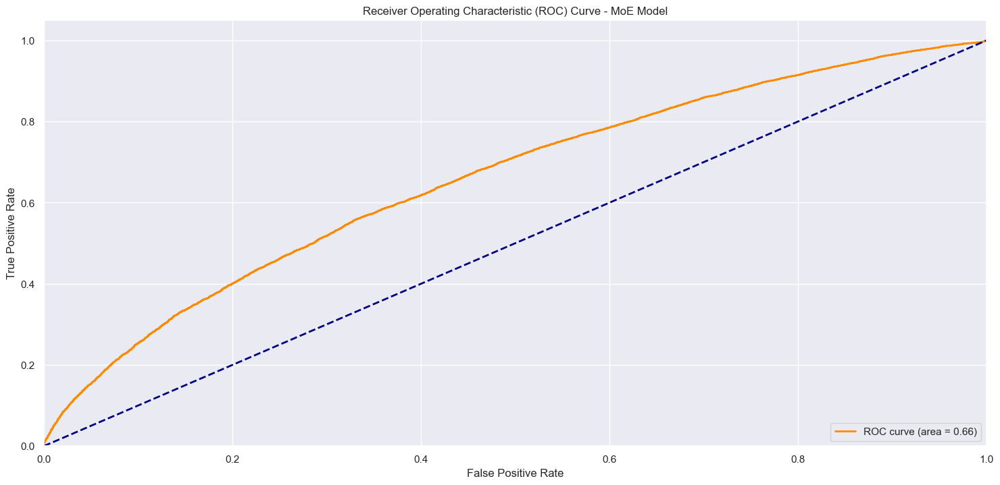

In [53]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, f1_score, roc_curve, auc
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Dense, Concatenate, Input
import numpy as np
import matplotlib.pyplot as plt

# Assuming your target column is 'readmitted'

# Split data into features (X) and target variable (y)
X = df.drop('readmitted', axis=1)  # Features
y = df['readmitted']  # Target variable

# Apply SMOTE to oversample the minority class
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Split dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Reshape X to 3D array for LSTM input (samples, timesteps, features)
X_train = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Define LSTM expert model
def create_lstm_expert(input_shape):
    model = Sequential()
    model.add(LSTM(units=32, activation='relu', input_shape=input_shape))
    model.add(Dense(1, activation='sigmoid'))
    return model

# Create multiple LSTM experts
num_experts = 3
experts = [create_lstm_expert((X_train.shape[1], X_train.shape[2])) for _ in range(num_experts)]

# Define gating network
gating_input = Input(shape=(num_experts,))
gating_output = Dense(num_experts, activation='softmax')(gating_input)
gating_model = Model(inputs=gating_input, outputs=gating_output)

# Combine experts and gating network
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))
expert_outputs = [expert(inputs) for expert in experts]
combined_expert_output = Concatenate()(expert_outputs)
gating_output = gating_model(combined_expert_output)

# Define final output layer
output = Dense(1, activation='sigmoid')(gating_output)

# Create MoE model
model = Model(inputs=inputs, outputs=output)

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=1)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred.round())  # Round predictions for binary classification
print("Accuracy:", accuracy)

# Calculate precision, recall, and F1 score for the MoE model
precision = precision_score(y_test, y_pred.round())
recall = recall_score(y_test, y_pred.round())
f1 = f1_score(y_test, y_pred.round())

# Print precision, recall, and F1 score for the MoE model
print("Precision (MoE):", precision)
print("Recall (MoE):", recall)
print("F1 Score (MoE):", f1)

# Print classification report for the MoE model
print("Classification Report (MoE):")
print(classification_report(y_test, y_pred.round()))

# Compute ROC curve and AUC for the MoE model
fpr_moe, tpr_moe, thresholds_moe = roc_curve(y_test, y_pred)
roc_auc_moe = auc(fpr_moe, tpr_moe)

# Plot ROC curve for the MoE model
plt.figure()
plt.plot(fpr_moe, tpr_moe, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_moe)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - MoE Model')
plt.legend(loc="lower right")
plt.show()


# FNN with smote and MOE

Mixture of Experts (MoE) Classifier Metrics:
Accuracy: 0.5642011686560455
Precision: 0.6126400654885574
Recall: 0.5642011686560455
F1 Score: 0.5345086927701365

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.32      0.44     10606
           1       0.52      0.84      0.64      9417

    accuracy                           0.56     20023
   macro avg       0.61      0.58      0.54     20023
weighted avg       0.61      0.56      0.53     20023



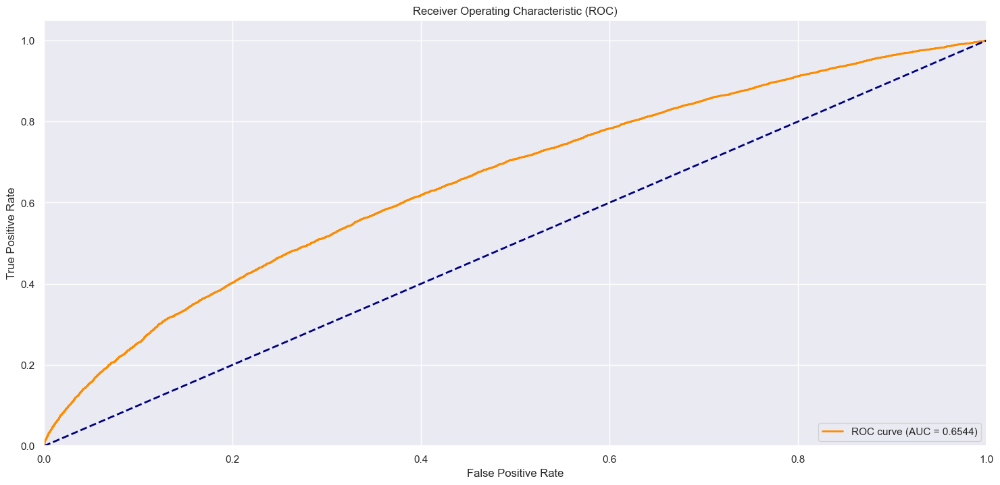

In [54]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from imblearn.over_sampling import SMOTE
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming your numerical data is stored in X and target variable in y

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to oversample the minority class
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Define the base FNN classifier
fnn_classifier = MLPClassifier(max_iter=1000, random_state=42)

# Define parameter grid for GridSearchCV
param_grid = {
    'hidden_layer_sizes': [(32,), (16,), (32, 16)],
    'alpha': [0.0001, 0.0005, 0.001],
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=fnn_classifier, param_grid=param_grid, cv=3, scoring='accuracy')

# Train the model with GridSearchCV
grid_search.fit(X_train_resampled, y_train_resampled)

# Get the best model
best_fnn_model = grid_search.best_estimator_

# Train multiple FNN classifiers for MoE
num_experts = 3
expert_models = [MLPClassifier(max_iter=1000, random_state=42, **grid_search.best_params_) for _ in range(num_experts)]

# Train expert models with best parameters
for model in expert_models:
    model.set_params(**grid_search.best_params_)
    model.fit(X_train_resampled, y_train_resampled)

# Create MoE ensemble
moes = [('expert' + str(i), model) for i, model in enumerate(expert_models)]
moe_classifier = VotingClassifier(estimators=moes, voting='soft')

# Train the MoE ensemble
moe_classifier.fit(X_train_resampled, y_train_resampled)

# Make predictions on the test set
y_pred_moe = moe_classifier.predict(X_test)

# Evaluate the MoE model
accuracy_moe = accuracy_score(y_test, y_pred_moe)
precision_moe = precision_score(y_test, y_pred_moe, average='weighted')
recall_moe = recall_score(y_test, y_pred_moe, average='weighted')
f1_moe = f1_score(y_test, y_pred_moe, average='weighted')

print("Mixture of Experts (MoE) Classifier Metrics:")
print(f'Accuracy: {accuracy_moe}')
print(f'Precision: {precision_moe}')
print(f'Recall: {recall_moe}')
print(f'F1 Score: {f1_moe}')

# Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_moe))

# ROC AUC Curve
y_proba_moe = moe_classifier.predict_proba(X_test)
fpr, tpr, _ = roc_curve(y_test, y_proba_moe[:, 1], pos_label=1)
roc_auc = auc(fpr, tpr)

plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (AUC = %0.4f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

# LSTM with Smote and MOE

Epoch 1/10
2661/2661 [==============================] - 19s 5ms/step - loss: 0.6934 - accuracy: 0.4979
Epoch 2/10
2661/2661 [==============================] - 13s 5ms/step - loss: 0.6932 - accuracy: 0.4981
Epoch 3/10
2661/2661 [==============================] - 13s 5ms/step - loss: 0.6932 - accuracy: 0.5009
Epoch 4/10
2661/2661 [==============================] - 14s 5ms/step - loss: 0.6932 - accuracy: 0.4986
Epoch 5/10
2661/2661 [==============================] - 13s 5ms/step - loss: 0.6932 - accuracy: 0.4991
Epoch 6/10
2661/2661 [==============================] - 13s 5ms/step - loss: 0.6932 - accuracy: 0.5005
Epoch 7/10
2661/2661 [==============================] - 13s 5ms/step - loss: 0.6932 - accuracy: 0.4989
Epoch 8/10
2661/2661 [==============================] - 13s 5ms/step - loss: 0.6932 - accuracy: 0.5028
Epoch 9/10
2661/2661 [==============================] - 13s 5ms/step - loss: 0.6932 - accuracy: 0.5010
Epoch 10/10
666/666 [==============================] - 2s 2ms/step
LSTM w

C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\nachi\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


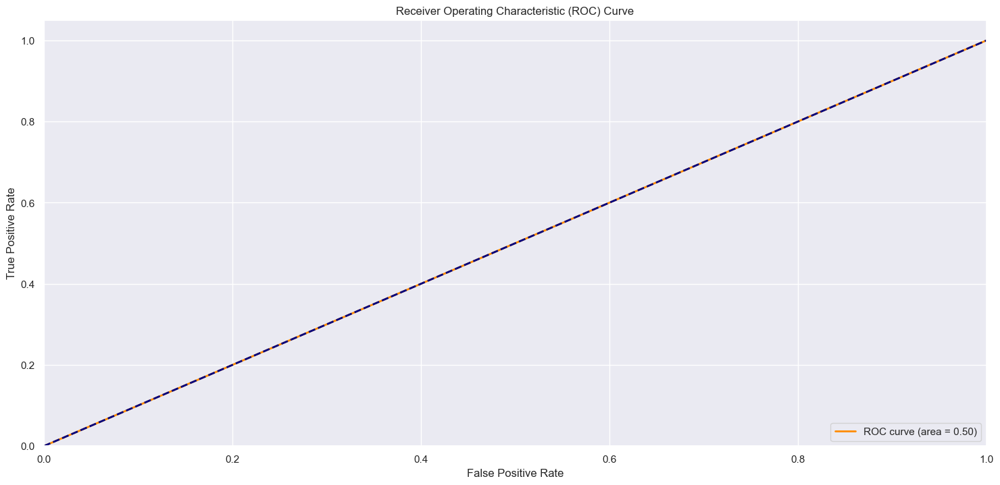

In [55]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Dense, Concatenate, Input
import numpy as np
from sklearn.utils import class_weight
from sklearn.metrics import precision_score, recall_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt

# Assuming your target column is 'readmitted'
X = df.drop('readmitted', axis=1)  # Features
y = df['readmitted']  # Target variable

# Apply SMOTE to oversample the minority class
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Split resampled data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Reshape X to 3D array for LSTM input (samples, timesteps, features)
X_train = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Define LSTM expert model
def create_lstm_expert(input_shape):
    model = Sequential()
    model.add(LSTM(units=32, activation='relu', input_shape=input_shape))
    model.add(Dense(1, activation='sigmoid'))
    return model

# Create multiple LSTM experts
num_experts = 3
experts = [create_lstm_expert((X_train.shape[1], X_train.shape[2])) for _ in range(num_experts)]

# Define gating network
gating_input = Input(shape=(num_experts,))
gating_output = Dense(num_experts, activation='softmax')(gating_input)
gating_model = Model(inputs=gating_input, outputs=gating_output)

# Combine experts and gating network
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))
expert_outputs = [expert(inputs) for expert in experts]
combined_expert_output = Concatenate()(expert_outputs)
gating_output = gating_model(combined_expert_output)

# Define final output layer
output = Dense(1, activation='sigmoid')(gating_output)

# Create MoE model
model = Model(inputs=inputs, outputs=output)

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Round predictions for binary classification
y_pred_round = y_pred.round()

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_round)
print("LSTM with Mixture of Experts (MoE) Classifier Metrics with SMOTE:")
print(f'Accuracy: {accuracy}')
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Dense, Concatenate, Input
import numpy as np
from sklearn.utils import class_weight

# Assuming your target column is 'readmitted'
X = df.drop('readmitted', axis=1)  # Features
y = df['readmitted']  # Target variable

# Apply SMOTE to oversample the minority class
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Split resampled data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Reshape X to 3D array for LSTM input (samples, timesteps, features)
X_train = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Define LSTM expert model
def create_lstm_expert(input_shape):
    model = Sequential()
    model.add(LSTM(units=32, activation='relu', input_shape=input_shape))
    model.add(Dense(1, activation='sigmoid'))
    return model

# Create multiple LSTM experts
num_experts = 3
experts = [create_lstm_expert((X_train.shape[1], X_train.shape[2])) for _ in range(num_experts)]

# Define gating network
gating_input = Input(shape=(num_experts,))
gating_output = Dense(num_experts, activation='softmax')(gating_input)
gating_model = Model(inputs=gating_input, outputs=gating_output)

# Combine experts and gating network
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))
expert_outputs = [expert(inputs) for expert in experts]
combined_expert_output = Concatenate()(expert_outputs)
gating_output = gating_model(combined_expert_output)

# Define final output layer
output = Dense(1, activation='sigmoid')(gating_output)

# Create MoE model
model = Model(inputs=inputs, outputs=output)

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Round predictions for binary classification
y_pred_round = y_pred.round()

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_round)
print("LSTM with Mixture of Experts (MoE) Classifier Metrics with SMOTE:")
print(f'Accuracy: {accuracy}')

import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, roc_curve, auc

# Compute precision, recall, and F1 score
precision = precision_score(y_test, y_pred_round)
recall = recall_score(y_test, y_pred_round)
f1 = f1_score(y_test, y_pred_round)

# Print precision, recall, and F1 score
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_round))

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Stacking

Learning rate set to 0.5
0:	learn: 0.6671051	total: 48.1ms	remaining: 4.76s
1:	learn: 0.6501855	total: 98.4ms	remaining: 4.82s
2:	learn: 0.6314788	total: 148ms	remaining: 4.8s
3:	learn: 0.6262507	total: 196ms	remaining: 4.7s
4:	learn: 0.6213362	total: 245ms	remaining: 4.66s
5:	learn: 0.6197553	total: 292ms	remaining: 4.57s
6:	learn: 0.6177174	total: 341ms	remaining: 4.54s
7:	learn: 0.6131329	total: 398ms	remaining: 4.58s
8:	learn: 0.6117198	total: 450ms	remaining: 4.54s
9:	learn: 0.6109011	total: 499ms	remaining: 4.49s
10:	learn: 0.6102186	total: 546ms	remaining: 4.41s
11:	learn: 0.6093694	total: 594ms	remaining: 4.36s
12:	learn: 0.6088868	total: 638ms	remaining: 4.27s
13:	learn: 0.6087008	total: 682ms	remaining: 4.19s
14:	learn: 0.6070380	total: 727ms	remaining: 4.12s
15:	learn: 0.6065640	total: 775ms	remaining: 4.07s
16:	learn: 0.6059507	total: 822ms	remaining: 4.01s
17:	learn: 0.6053646	total: 872ms	remaining: 3.97s
18:	learn: 0.6047932	total: 921ms	remaining: 3.92s
19:	learn: 0.604

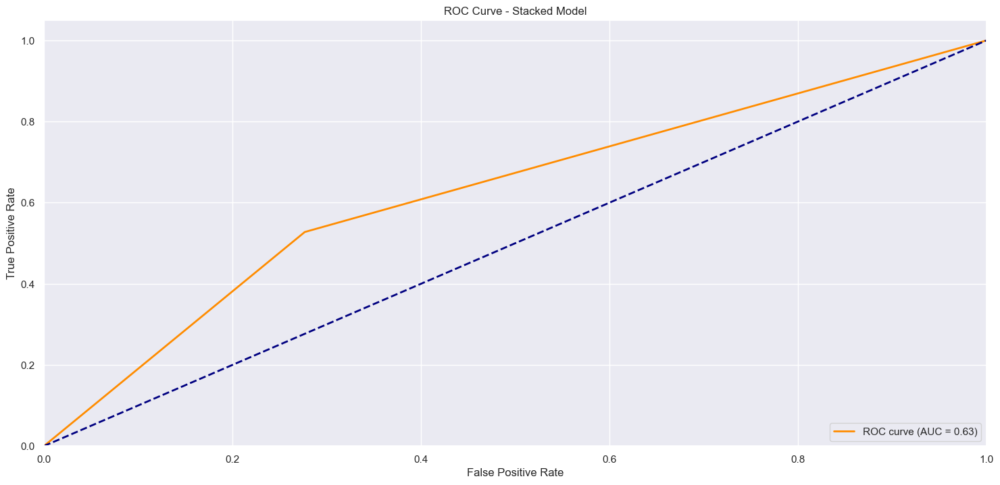

In [59]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, roc_curve, auc
from imblearn.over_sampling import SMOTE
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import StackingClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import numpy as np
import matplotlib.pyplot as plt

# Assuming your data is stored in X and target variable in y

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to oversample the minority class
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Ensure the input shape for LSTM is correct
# Reshape X_train_resampled to 3D array for LSTM input (samples, timesteps, features)
X_train_lstm = X_train_resampled.values.reshape((X_train_resampled.shape[0], 1, X_train_resampled.shape[1]))

# Train individual models

# Random Forest
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train_resampled, y_train_resampled)

# CatBoost
catboost_classifier = CatBoostClassifier(iterations=100, random_state=42)
catboost_classifier.fit(X_train_resampled, y_train_resampled)

# LSTM
model_lstm = Sequential()
model_lstm.add(LSTM(units=32, activation='relu', input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])))
model_lstm.add(Dense(1, activation='sigmoid'))
model_lstm.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model_lstm.fit(X_train_lstm, y_train_resampled, epochs=10, batch_size=32, verbose=0)

# MLP
mlp_classifier = MLPClassifier(max_iter=1000, random_state=42)
mlp_classifier.fit(X_train_resampled, y_train_resampled)

# Generate predictions of individual models on the test set
rf_test_pred = rf_classifier.predict_proba(X_test)[:, 1]
catboost_test_pred = catboost_classifier.predict_proba(X_test)[:, 1]
lstm_test_pred = model_lstm.predict(X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))).flatten()
mlp_test_pred = mlp_classifier.predict_proba(X_test)[:, 1]

# Stack the predictions for the test set
X_test_stacked = np.column_stack((rf_test_pred, catboost_test_pred, lstm_test_pred, mlp_test_pred))

# Define and train the meta-classifier (Logistic Regression is used here)
meta_classifier = LogisticRegression()
meta_classifier.fit(X_test_stacked, y_test)

# Use the meta-classifier to combine the predictions
y_pred_stacked = meta_classifier.predict(X_test_stacked)

# Compute and print the classification report for the stacked model
print("Classification Report for Stacked Model:")
print(classification_report(y_test, y_pred_stacked))

# Compute ROC curve and AUC for the stacked model
fpr, tpr, thresholds = roc_curve(y_test, y_pred_stacked)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Stacked Model')
plt.legend(loc="lower right")
plt.show()
